In [143]:
import numpy as np
import pandas as pd
import re
import matplotlib.pyplot as plt
from matplotlib import rcParams
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from wordcloud import WordCloud
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report,plot_confusion_matrix

In [2]:
True_data = pd.read_csv('true.csv')
fake_data = pd.read_csv('fake.csv')

In [3]:
True_data

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"
...,...,...,...,...
21412,'Fully committed' NATO backs new U.S. approach...,BRUSSELS (Reuters) - NATO allies on Tuesday we...,worldnews,"August 22, 2017"
21413,LexisNexis withdrew two products from Chinese ...,"LONDON (Reuters) - LexisNexis, a provider of l...",worldnews,"August 22, 2017"
21414,Minsk cultural hub becomes haven from authorities,MINSK (Reuters) - In the shadow of disused Sov...,worldnews,"August 22, 2017"
21415,Vatican upbeat on possibility of Pope Francis ...,MOSCOW (Reuters) - Vatican Secretary of State ...,worldnews,"August 22, 2017"


In [4]:
fake_data

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"
...,...,...,...,...
23476,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,"January 16, 2016"
23477,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,"January 16, 2016"
23478,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,"January 15, 2016"
23479,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,"January 14, 2016"


In [5]:
True_data['subject'].value_counts()

politicsNews    11272
worldnews       10145
Name: subject, dtype: int64

Text(0.5, 1.0, 'News')

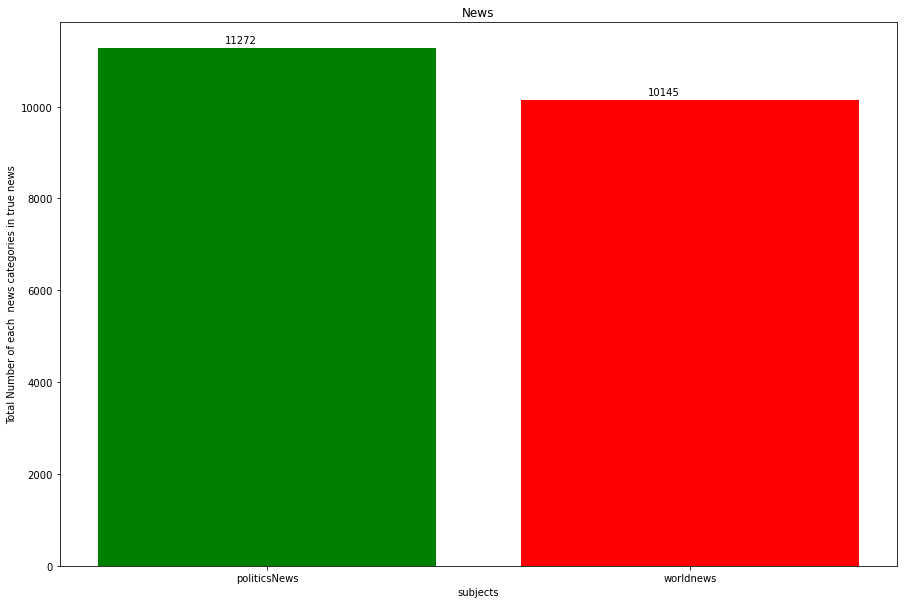

In [6]:
plt.figure(figsize = (15, 10))
plt.bar(['politicsNews','worldnews'],True_data['subject'].value_counts().values,color = ['g','r'])
for i, v in enumerate(True_data['subject'].value_counts()):
    plt.text(i - 0.1, v+100, str(v))
plt.xlabel('subjects')
plt.ylabel('Total Number of each  news categories in true news')
plt.title('News')

In [7]:
fake_data['subject'].value_counts()

News               9050
politics           6841
left-news          4459
Government News    1570
US_News             783
Middle-east         778
Name: subject, dtype: int64

Text(0.5, 1.0, 'News')

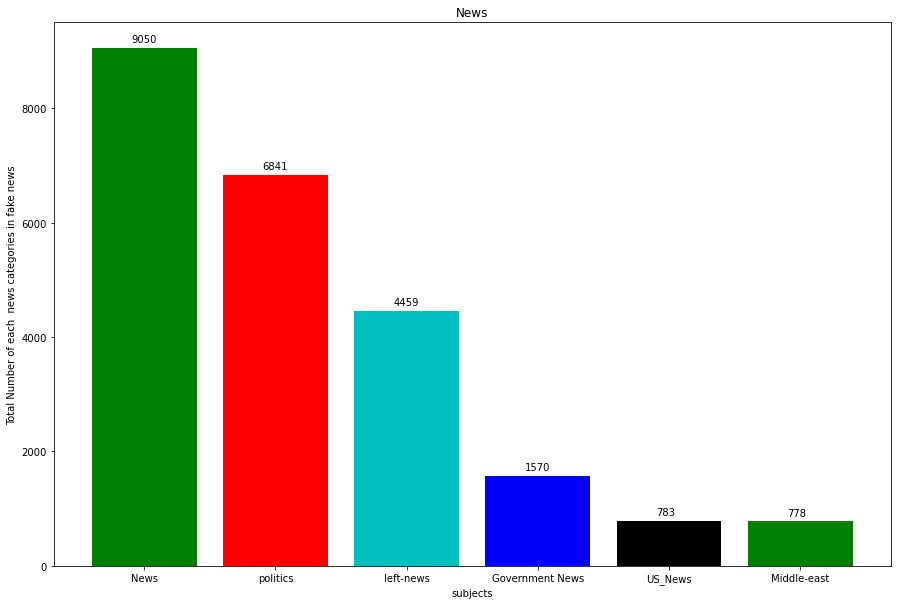

In [8]:
plt.figure(figsize = (15, 10))
plt.bar(['News','politics','left-news','Government News','US_News','Middle-east'],fake_data['subject'].value_counts().values,color = ['g','r','c','b','k'])
for i, v in enumerate(fake_data['subject'].value_counts()):
    plt.text(i - 0.1, v+100, str(v))
plt.xlabel('subjects')
plt.ylabel('Total Number of each  news categories in fake news')
plt.title('News')

## True news category analysis

In [9]:
politics = True_data[True_data['subject'] == 'politicsNews']

In [10]:
worldnews = True_data[True_data['subject'] == 'worldnews']

In [11]:
politics_text_len = politics['text'].str.len()

In [12]:
politics_text_len

0        4659
1        4077
2        2789
3        2461
4        5204
         ... 
11267     418
11268     679
11269    2730
11270    2022
11271    2163
Name: text, Length: 11272, dtype: int64

In [13]:
worldnews_text_len = worldnews['text'].str.len()

In [14]:
worldnews_text_len

11272    3590
11273    1460
11274    1703
11275    1547
11276     426
         ... 
21412    2821
21413     800
21414    1950
21415    1199
21416    1338
Name: text, Length: 10145, dtype: int64

In [15]:
print("The maximum lenght of string in Politcs news is {} words".format(max(politics_text_len)))
print("The maximum lenght of string in World news is {} words".format(max(worldnews_text_len)))

The maximum lenght of string in Politcs news is 29781 words
The maximum lenght of string in World news is 17999 words


In [16]:
stop = set(stopwords.words('english'))

In [17]:
def tokenizeandstopwords(text):
    tokens = nltk.word_tokenize(text)
    # taken only words (not punctuation)
    token_words = [w for w in tokens if w.isalpha()]
    meaningful_words = [w for w in token_words if not w in stop]
    joined_words = ( " ".join(meaningful_words))
    return joined_words    

In [18]:
politics['text'] = politics['text'].apply(tokenizeandstopwords)
worldnews['text'] = worldnews['text'].apply(tokenizeandstopwords)

In [19]:
politics['text']

0        WASHINGTON Reuters The head conservative Repub...
1        WASHINGTON Reuters Transgender people allowed ...
2        WASHINGTON Reuters The special counsel investi...
3        WASHINGTON Reuters Trump campaign adviser Geor...
4        Reuters President Donald Trump called Postal S...
                               ...                        
11267    WASHINGTON Reuters President Barack Obama said...
11268    WASHINGTON Reuters President Barack Obama warn...
11269    MANCHESTER Reuters Democratic presidential can...
11270    WASHINGTON Reuters President Barack Obama said...
11271    AMES Iowa Reuters Democratic presidential cand...
Name: text, Length: 11272, dtype: object

In [20]:
worldnews['text']

11272    YANGON Reuters Two Reuters journalists detaine...
11273    DUBAI Reuters Kuwait deputy foreign minister s...
11274    ABUJA Reuters The United States formally agree...
11275    BEIRUT Reuters Syrian rebels pocket land near ...
11276    WASHINGTON Reuters President Donald Trump host...
                               ...                        
21412    BRUSSELS Reuters NATO allies Tuesday welcomed ...
21413    LONDON Reuters LexisNexis provider legal regul...
21414    MINSK Reuters In shadow disused factories Mins...
21415    MOSCOW Reuters Vatican Secretary State Cardina...
21416    JAKARTA Reuters Indonesia buy Sukhoi fighter j...
Name: text, Length: 10145, dtype: object

In [21]:
def generate_word_cloud(text):
    wordcloud = WordCloud(
        width = 3000,
        height = 2000,
        background_color = 'black').generate(str(text))
    fig = plt.figure(
        figsize = (40, 30),
        facecolor = 'k',
        edgecolor = 'k')
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()

In [22]:
politics_text = politics['text'].values

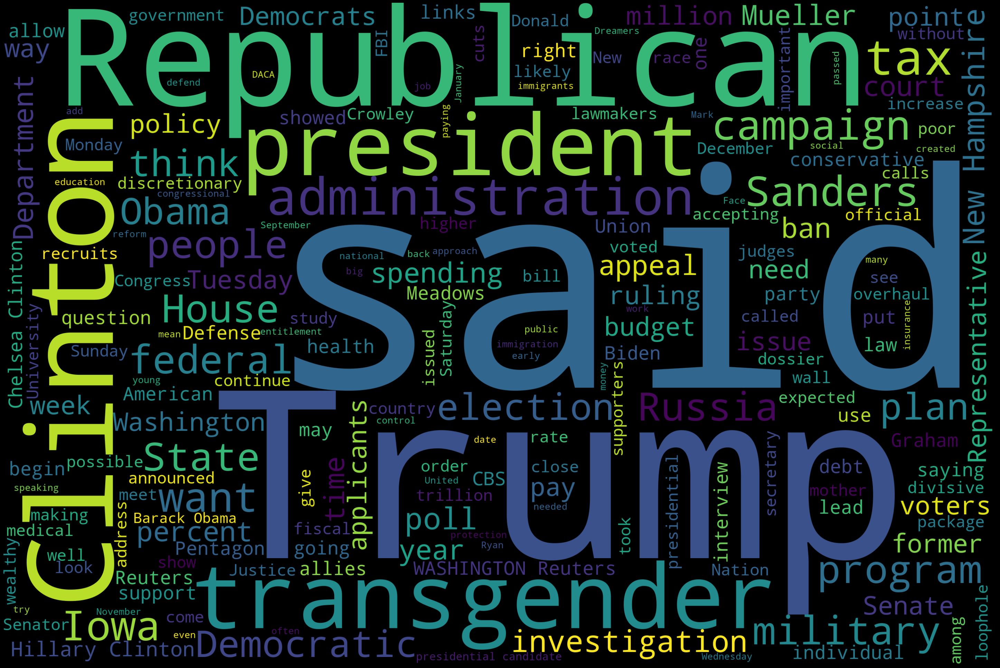

In [23]:
generate_word_cloud(politics_text)

In [24]:
worldnews_text = worldnews['text'].values

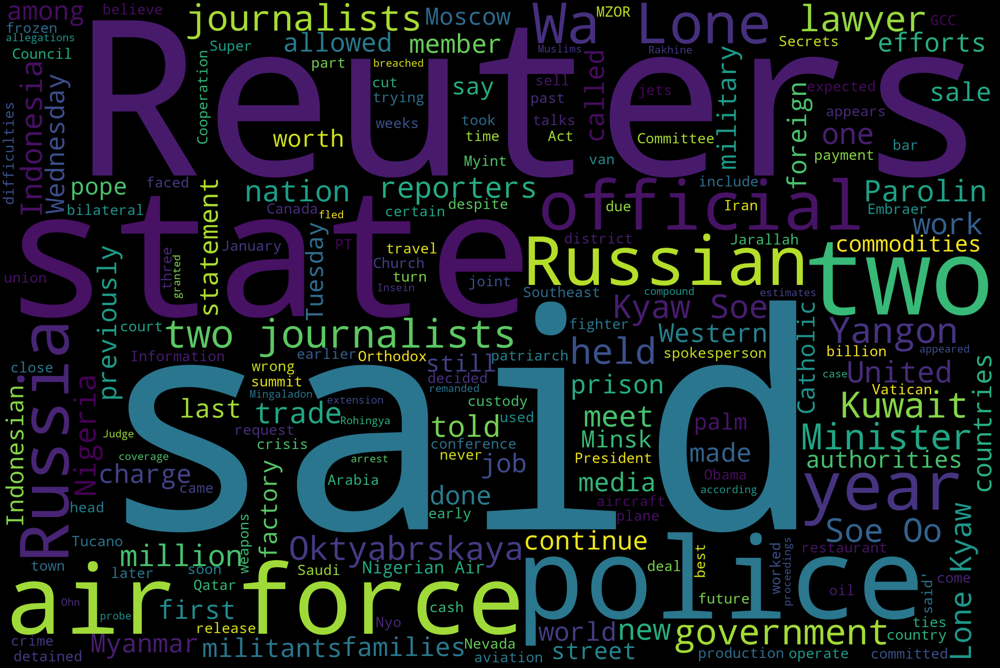

In [25]:
generate_word_cloud(worldnews_text)

## Fake news category analysis

In [26]:
fake_data['subject'].value_counts()

News               9050
politics           6841
left-news          4459
Government News    1570
US_News             783
Middle-east         778
Name: subject, dtype: int64

In [27]:
news = fake_data[fake_data['subject']=='News']
politics_fake = fake_data[fake_data['subject']=='politics']
left_news = fake_data[fake_data['subject']=='left-news']
Government_News = fake_data[fake_data['subject']=='Government News']
US_News = fake_data[fake_data['subject']=='US_News']
Middle_east = fake_data[fake_data['subject']=='Middle-east']

In [28]:
news['text'] = news['text'].apply(tokenizeandstopwords)
politics_fake['text'] = politics_fake['text'].apply(tokenizeandstopwords)
left_news['text'] = left_news['text'].apply(tokenizeandstopwords)
Government_News['text'] = Government_News['text'].apply(tokenizeandstopwords)
US_News['text'] = US_News['text'].apply(tokenizeandstopwords)
Middle_east['text'] = Middle_east['text'].apply(tokenizeandstopwords)

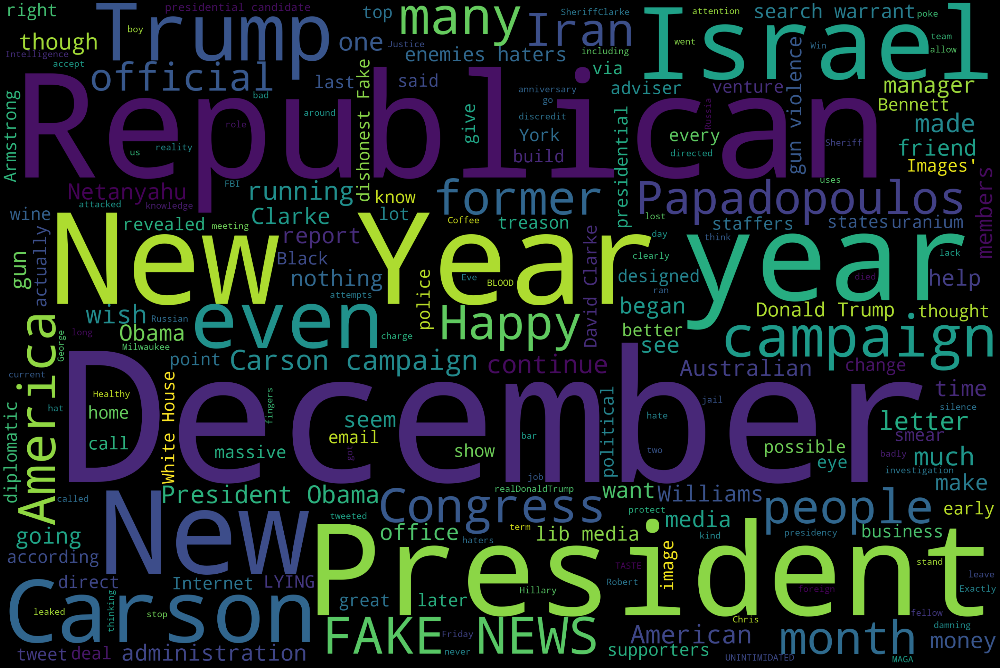

In [29]:
news_text = news['text'].values
generate_word_cloud(news_text)

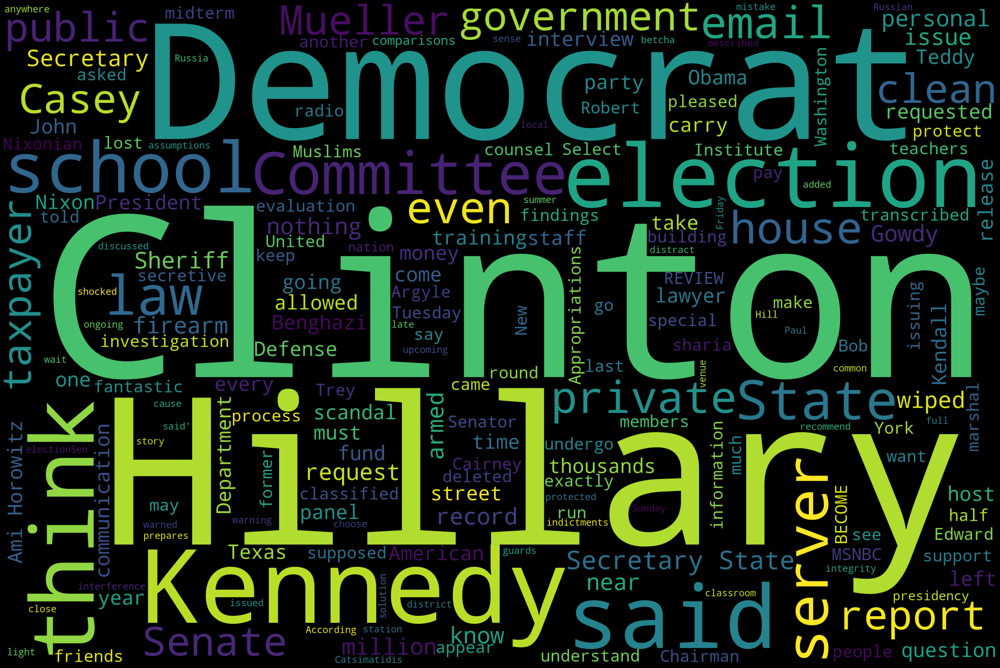

In [30]:
politics_fake_text = politics_fake['text'].values
generate_word_cloud(politics_fake_text)

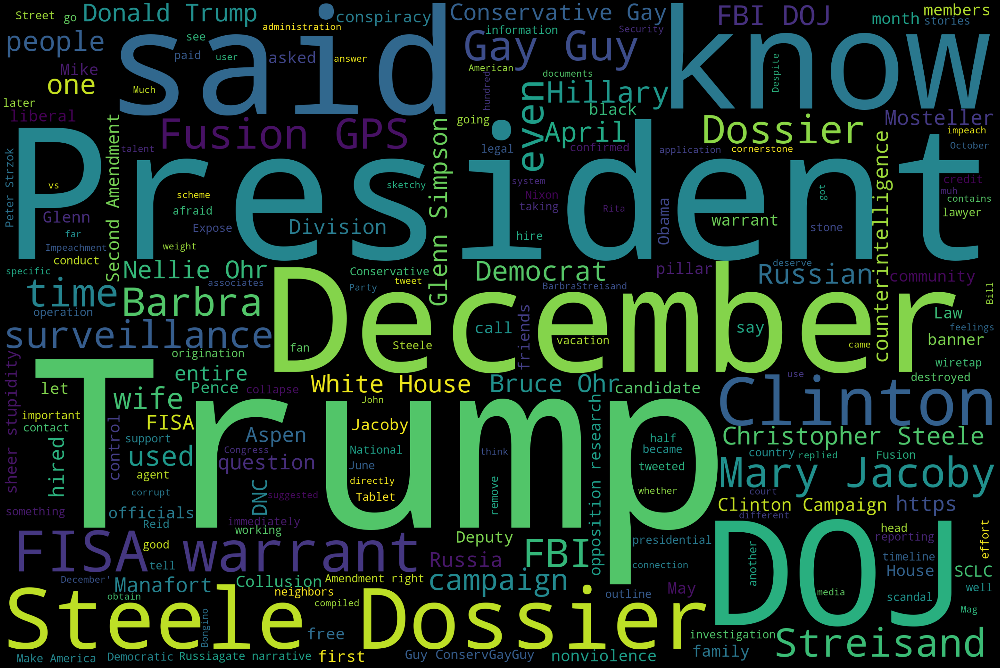

In [31]:
left_news_text = left_news['text'].values
generate_word_cloud(left_news_text)

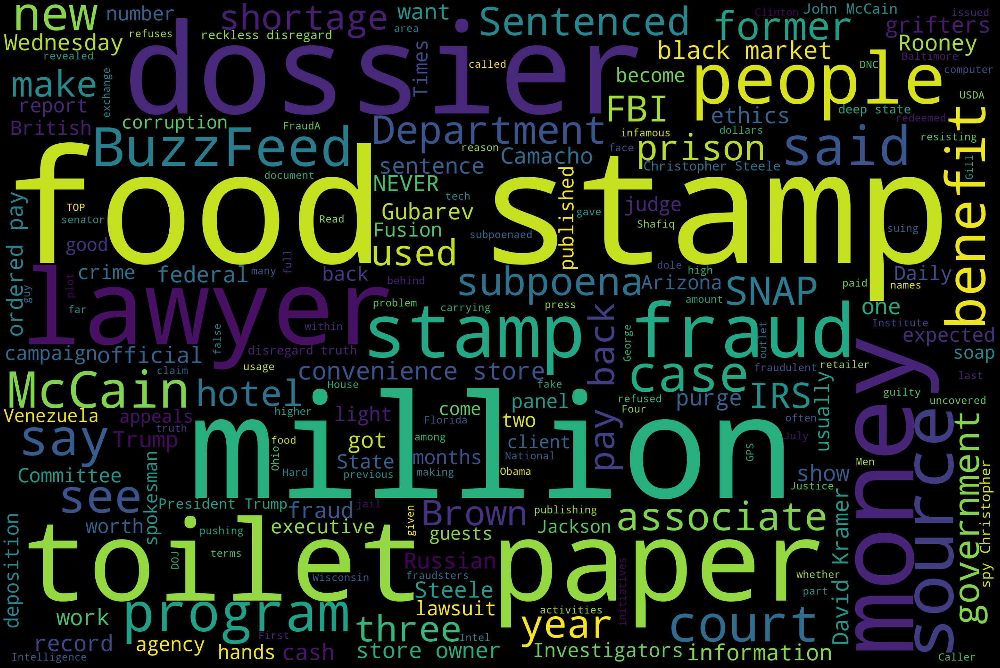

In [32]:
Government_News_text = Government_News['text'].values
generate_word_cloud(Government_News_text)

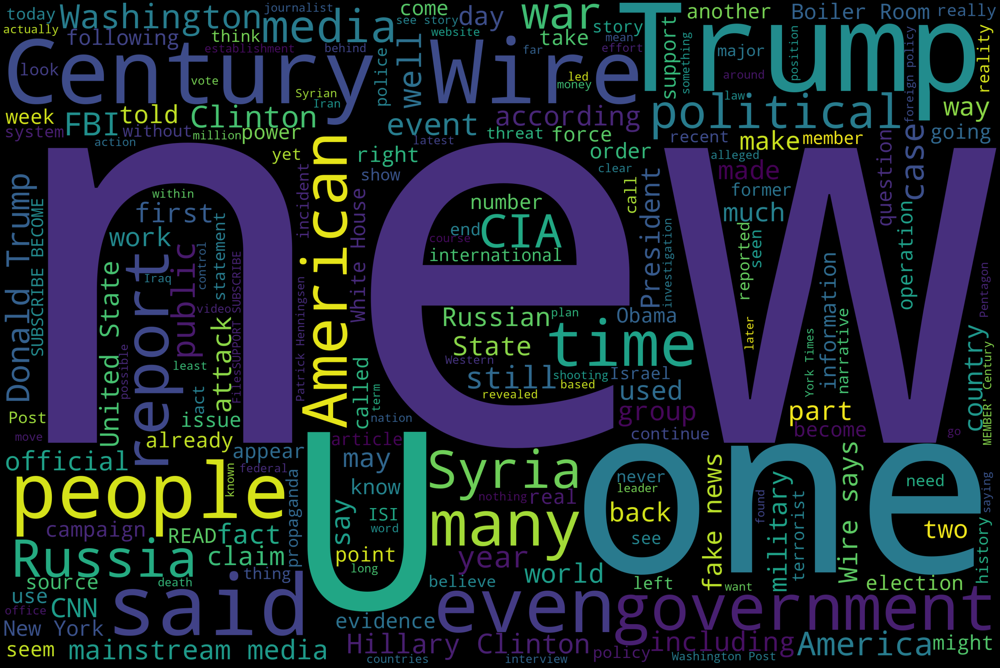

In [33]:
US_News_text = US_News['text'].values
generate_word_cloud(US_News_text)

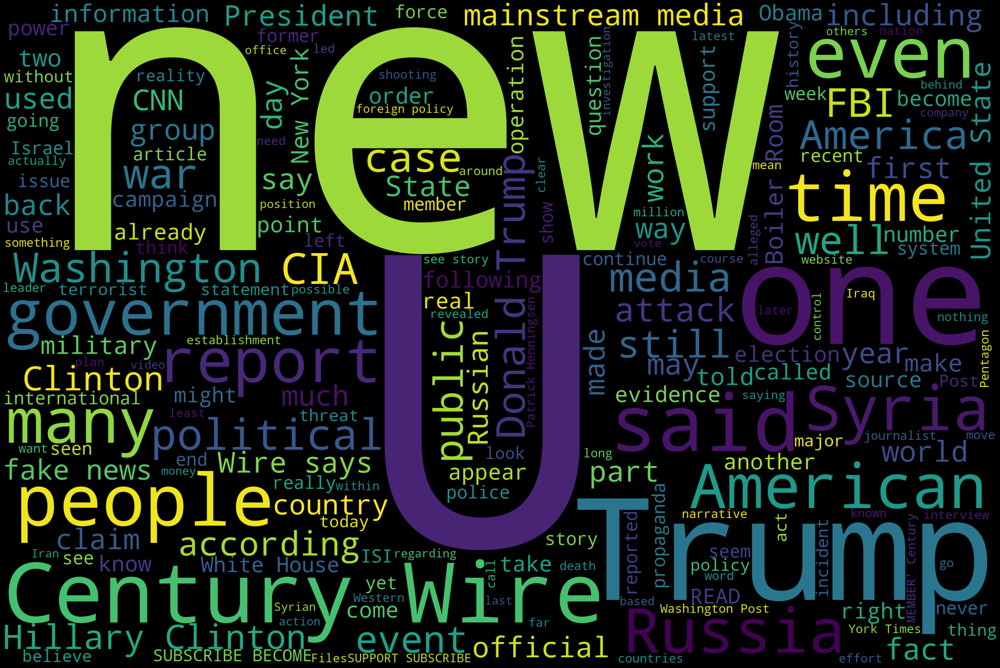

In [34]:
Middle_east_text = Middle_east['text'].values
generate_word_cloud(Middle_east_text)

In [35]:
True_data['target'] = 'true'
fake_data['target'] = 'false'

In [36]:
True_data

,title,text,subject,date,target
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",true
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",true
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",true
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",true
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",true
...,...,...,...,...,...
21412,'Fully committed' NATO backs new U.S. approach...,BRUSSELS (Reuters) - NATO allies on Tuesday we...,worldnews,"August 22, 2017",true
21413,LexisNexis withdrew two products from Chinese ...,"LONDON (Reuters) - LexisNexis, a provider of l...",worldnews,"August 22, 2017",true
21414,Minsk cultural hub becomes haven from authorities,MINSK (Reuters) - In the shadow of disused Sov...,worldnews,"August 22, 2017",true
21415,Vatican upbeat on possibility of Pope Francis ...,MOSCOW (Reuters) - Vatican Secretary of State ...,worldnews,"August 22, 2017",true


In [37]:
News = pd.concat([True_data,fake_data],ignore_index=True)

In [38]:
News

,title,text,subject,date,target
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",true
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",true
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",true
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",true
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",true
...,...,...,...,...,...
44893,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,"January 16, 2016",false
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,"January 16, 2016",false
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,"January 15, 2016",false
44896,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,"January 14, 2016",false


In [42]:
News['text'] = News['text'].apply(lambda z: re.sub('http://S+'," ",z))

In [45]:
News['text'] = News['text'].apply(lambda x: re.sub('\@'," ",x.lower()))

In [47]:
News['text'][0]

'washington (reuters) - the head of a conservative republican faction in the u.s. congress, who voted this month for a huge expansion of the national debt to pay for tax cuts, called himself a “fiscal conservative” on sunday and urged budget restraint in 2018. in keeping with a sharp pivot under way among republicans, u.s. representative mark meadows, speaking on cbs’ “face the nation,” drew a hard line on federal spending, which lawmakers are bracing to do battle over in january. when they return from the holidays on wednesday, lawmakers will begin trying to pass a federal budget in a fight likely to be linked to other issues, such as immigration policy, even as the november congressional election campaigns approach in which republicans will seek to keep control of congress. president donald trump and his republicans want a big budget increase in military spending, while democrats also want proportional increases for non-defense “discretionary” spending on programs that support educat

In [104]:
match = re.search(r'[^\w\s]', 'washington (reuters)')

In [105]:
match

<re.Match object; span=(11, 12), match='('>

In [106]:
True_data['text'].tolist()

['WASHINGTON (Reuters) - The head of a conservative Republican faction in the U.S. Congress, who voted this month for a huge expansion of the national debt to pay for tax cuts, called himself a “fiscal conservative” on Sunday and urged budget restraint in 2018. In keeping with a sharp pivot under way among Republicans, U.S. Representative Mark Meadows, speaking on CBS’ “Face the Nation,” drew a hard line on federal spending, which lawmakers are bracing to do battle over in January. When they return from the holidays on Wednesday, lawmakers will begin trying to pass a federal budget in a fight likely to be linked to other issues, such as immigration policy, even as the November congressional election campaigns approach in which Republicans will seek to keep control of Congress. President Donald Trump and his Republicans want a big budget increase in military spending, while Democrats also want proportional increases for non-defense “discretionary” spending on programs that support educa

In [108]:
def basic_clean(text):
    wnl = nltk.stem.WordNetLemmatizer()
    stopwords = nltk.corpus.stopwords.words('english')
    words = re.sub(r'[^\w\s]', '', text).split()
    return [wnl.lemmatize(word) for word in words if word not in stopwords]

In [110]:
true_word = basic_clean(''.join(str(True_data['text'].tolist())))

In [111]:
true_word

['WASHINGTON',
 'Reuters',
 'The',
 'head',
 'conservative',
 'Republican',
 'faction',
 'US',
 'Congress',
 'voted',
 'month',
 'huge',
 'expansion',
 'national',
 'debt',
 'pay',
 'tax',
 'cut',
 'called',
 'fiscal',
 'conservative',
 'Sunday',
 'urged',
 'budget',
 'restraint',
 '2018',
 'In',
 'keeping',
 'sharp',
 'pivot',
 'way',
 'among',
 'Republicans',
 'US',
 'Representative',
 'Mark',
 'Meadows',
 'speaking',
 'CBS',
 'Face',
 'Nation',
 'drew',
 'hard',
 'line',
 'federal',
 'spending',
 'lawmaker',
 'bracing',
 'battle',
 'January',
 'When',
 'return',
 'holiday',
 'Wednesday',
 'lawmaker',
 'begin',
 'trying',
 'pas',
 'federal',
 'budget',
 'fight',
 'likely',
 'linked',
 'issue',
 'immigration',
 'policy',
 'even',
 'November',
 'congressional',
 'election',
 'campaign',
 'approach',
 'Republicans',
 'seek',
 'keep',
 'control',
 'Congress',
 'President',
 'Donald',
 'Trump',
 'Republicans',
 'want',
 'big',
 'budget',
 'increase',
 'military',
 'spending',
 'Democrats'

In [117]:
true_bigrams_series = (pd.Series(nltk.ngrams(true_word, 2)).value_counts())[:20]

In [118]:
true_bigrams_series.sort_values()

(said, would)             2870
(Prime, Minister)         2906
(last, week)              2949
(US, President)           2956
(last, year)              3178
(told, reporter)          3184
(Islamic, State)          3349
(Trump, said)             3433
(told, Reuters)           3491
(official, said)          3520
(said, The)               3541
(New, York)               3567
(said, statement)         3878
(Reuters, The)            3921
(North, Korea)            5282
(President, Donald)       5913
(WASHINGTON, Reuters)     6483
(Donald, Trump)           7963
(White, House)            8269
(United, States)         12176
dtype: int64

Text(0.5, 0, '# of Occurances')

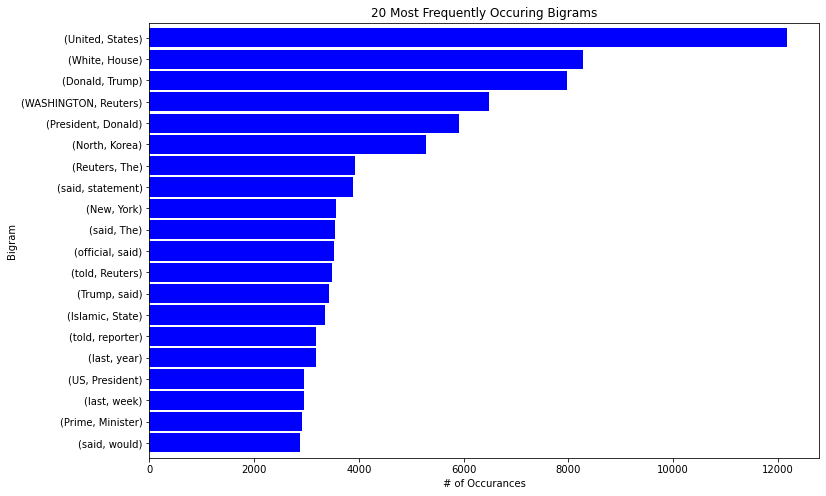

In [119]:
true_bigrams_series.sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Bigrams')
plt.ylabel('Bigram')
plt.xlabel('# of Occurances')

Text(0.5, 0, '# of Occurances')

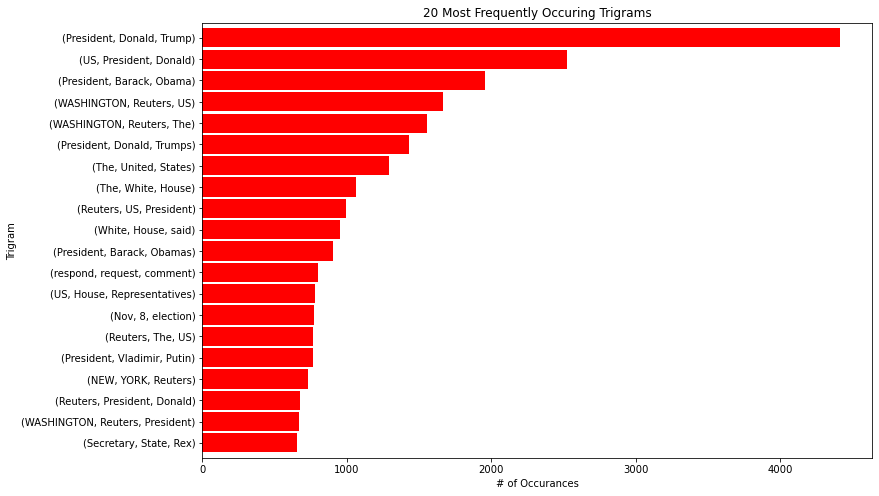

In [122]:
true_trigrams_series = (pd.Series(nltk.ngrams(true_word, 3)).value_counts())[:20]
true_trigrams_series.sort_values().plot.barh(color='red', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Trigrams')
plt.ylabel('Trigram')
plt.xlabel('# of Occurances')

In [123]:
false_word = basic_clean(''.join(str(fake_data['text'].tolist())))

In [124]:
false_bigrams_series = (pd.Series(nltk.ngrams(false_word, 2)).value_counts())[:20]

Text(0.5, 0, '# of Occurances')

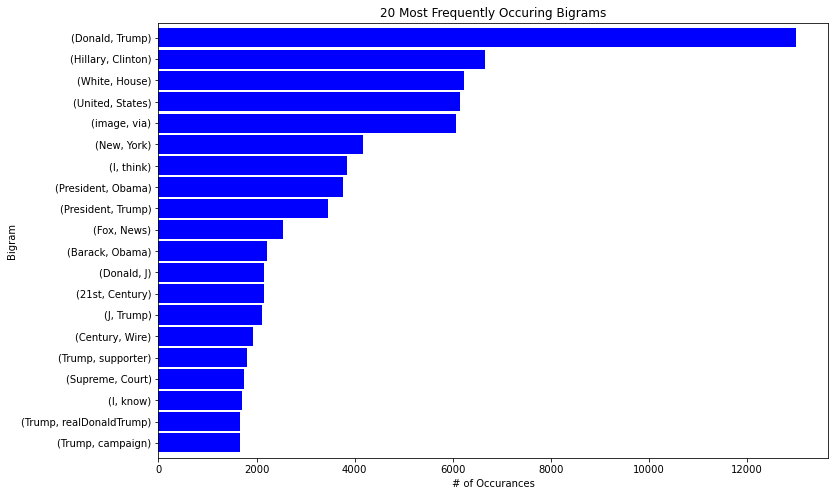

In [125]:
false_bigrams_series.sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Bigrams')
plt.ylabel('Bigram')
plt.xlabel('# of Occurances')

Text(0.5, 0, '# of Occurances')

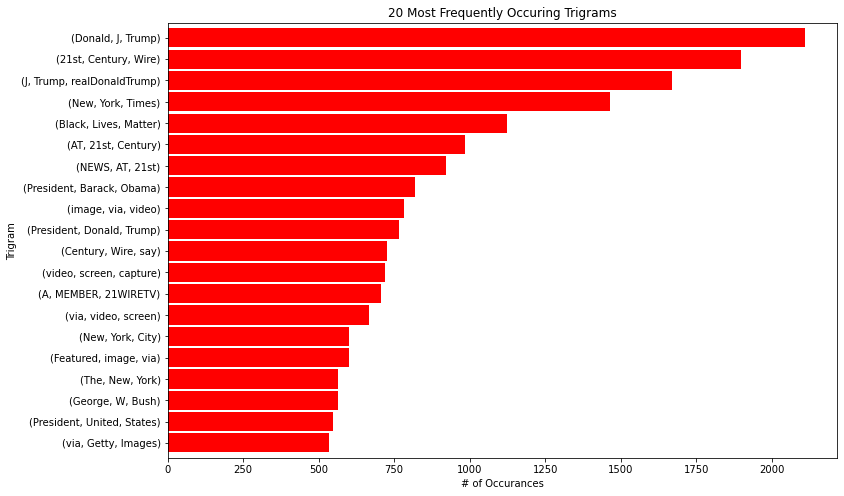

In [126]:
false_trigrams_series = (pd.Series(nltk.ngrams(false_word, 3)).value_counts())[:20]
false_trigrams_series.sort_values().plot.barh(color='red', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Trigrams')
plt.ylabel('Trigram')
plt.xlabel('# of Occurances')

In [127]:
words = basic_clean(''.join(str(news['text'].tolist())))

In [129]:
bigrams_series = (pd.Series(nltk.ngrams(words, 2)).value_counts())[:20]

Text(0.5, 0, '# of Occurances')

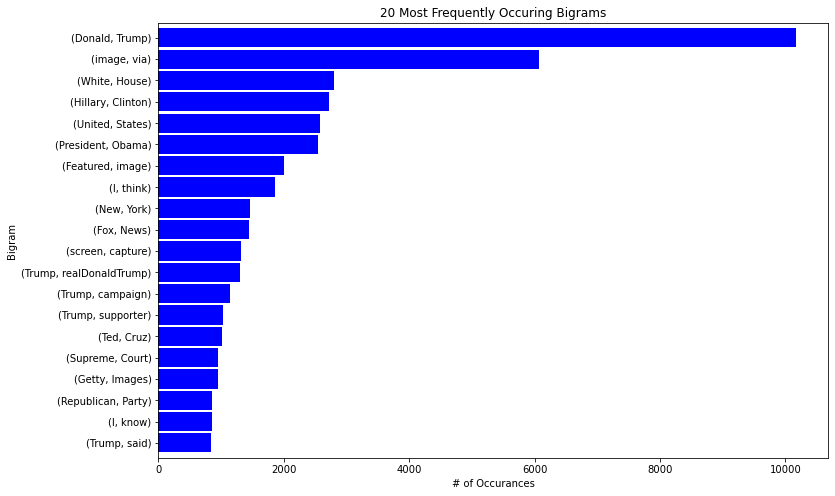

In [130]:
bigrams_series.sort_values().plot.barh(color='blue', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Bigrams')
plt.ylabel('Bigram')
plt.xlabel('# of Occurances')

In [131]:
trigrams_series = (pd.Series(nltk.ngrams(words, 3)).value_counts())[:20]

Text(0.5, 0, '# of Occurances')

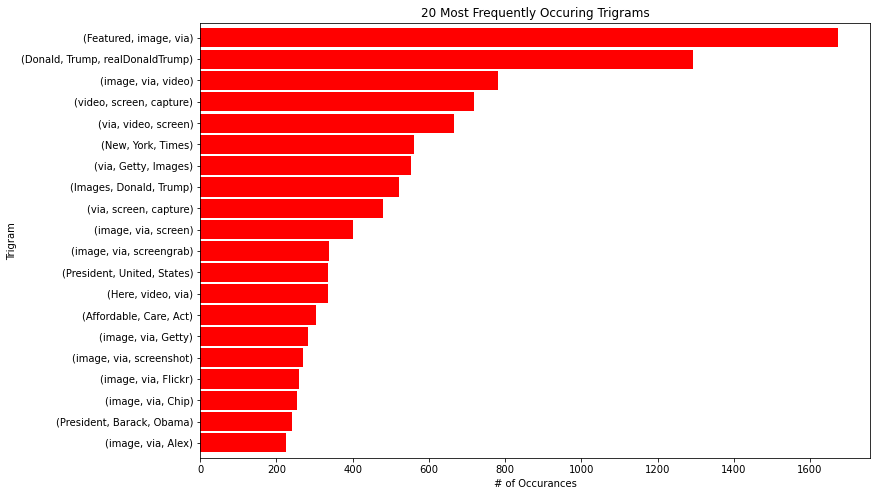

In [132]:
trigrams_series.sort_values().plot.barh(color='red', width=.9, figsize=(12, 8))
plt.title('20 Most Frequently Occuring Trigrams')
plt.ylabel('Trigram')
plt.xlabel('# of Occurances')

In [135]:
x_train,x_test,y_train,y_test = train_test_split(News['text'], News.target, test_size=0.2, random_state=2020)

In [139]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn import feature_extraction, linear_model, model_selection, preprocessing
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

In [140]:
pipe = Pipeline([('vect', CountVectorizer()),
                 ('tfidf', TfidfTransformer()),
                 ('model', LogisticRegression())])

In [141]:
model = pipe.fit(x_train, y_train)
prediction = model.predict(x_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))

accuracy: 98.82%


In [144]:
print(confusion_matrix(y_test, prediction))
print(classification_report(y_test, prediction))

[[4623   59]
 [  47 4251]]
              precision    recall  f1-score   support

       false       0.99      0.99      0.99      4682
        true       0.99      0.99      0.99      4298

    accuracy                           0.99      8980
   macro avg       0.99      0.99      0.99      8980
weighted avg       0.99      0.99      0.99      8980

